In [1]:
import logging
logger = logging.getLogger("spacy")
logger.setLevel(logging.ERROR)

import dask.bag as db
import json
import pandas as pd

docs = db.read_text('../input/arxiv/arxiv-metadata-oai-snapshot.json').map(json.loads)

In [2]:
docs.count().compute()

2472872

In [3]:
docs.take(1)

({'id': '0704.0001',
  'submitter': 'Pavel Nadolsky',
  'authors': "C. Bal\\'azs, E. L. Berger, P. M. Nadolsky, C.-P. Yuan",
  'title': 'Calculation of prompt diphoton production cross sections at Tevatron and\n  LHC energies',
  'comments': '37 pages, 15 figures; published version',
  'journal-ref': 'Phys.Rev.D76:013009,2007',
  'doi': '10.1103/PhysRevD.76.013009',
  'report-no': 'ANL-HEP-PR-07-12',
  'categories': 'hep-ph',
  'license': None,
  'abstract': '  A fully differential calculation in perturbative quantum chromodynamics is\npresented for the production of massive photon pairs at hadron colliders. All\nnext-to-leading order perturbative contributions from quark-antiquark,\ngluon-(anti)quark, and gluon-gluon subprocesses are included, as well as\nall-orders resummation of initial-state gluon radiation valid at\nnext-to-next-to-leading logarithmic accuracy. The region of phase space is\nspecified in which the calculation is most reliable. Good agreement is\ndemonstrated with d

In [4]:
get_latest_version = lambda x: x['versions'][-1]['created']

trim = lambda x: {'id': x['id'],
                  'authors': x['authors'],
                  'title': x['title'],
                  'doi': x['doi'],
                  'category':x['categories'].split(' '),
                  'abstract':x['abstract'],}
columns = ['id','category','abstract']
docs_df = (docs.filter(lambda x: int(get_latest_version(x).split(' ')[3]) > 2020)
           .map(trim).
           compute())

docs_df = pd.DataFrame(docs_df)

In [5]:
docs_df.to_csv("trimmed_arxiv_docs.csv", index=False)

In [6]:
docs_df.head()

,id,authors,title,doi,category,abstract
0,0704.0033,"Maxim A. Yurkin, Valeri P. Maltsev, Alfons G. ...",Convergence of the discrete dipole approximati...,10.1364/JOSAA.23.002578 10.1364/JOSAA.32.002407,"[physics.optics, physics.comp-ph]",We performed a rigorous theoretical converge...
1,0704.0038,"Maxim A. Yurkin, Alfons G. Hoekstra",The discrete dipole approximation: an overview...,10.1016/j.jqsrt.2007.01.034 10.1016/j.jqsrt.20...,"[physics.optics, physics.comp-ph]",We present a review of the discrete dipole a...
2,0704.0479,T.Geisser,The affine part of the Picard scheme,None,"[math.AG, math.KT]",We describe the maximal torus and maximal un...
3,0704.1476,Chris Austin,TeV-scale gravity in Horava-Witten theory on a...,None,[hep-th],The field equations and boundary conditions ...
4,0705.1155,Kerry M. Soileau,State Vector Determination By A Single Trackin...,None,[astro-ph],Using only a single tracking satellite capab...


In [7]:
df = pd.read_csv("./trimmed_arxiv_docs.csv")

/tmp/ipykernel_33/223106121.py:1: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv("./trimmed_arxiv_docs.csv")


In [8]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 715761 entries, 0 to 715760
Data columns (total 6 columns):
 #   Column    Non-Null Count   Dtype 
---  ------    --------------   ----- 
 0   id        715761 non-null  object
 1   authors   715761 non-null  object
 2   title     715761 non-null  object
 3   doi       210052 non-null  object
 4   category  715761 non-null  object
 5   abstract  715761 non-null  object
dtypes: object(6)
memory usage: 32.8+ MB


In [9]:
df.shape

(715761, 6)

In [10]:
df['abstract_word_count'] = docs_df['abstract'].apply(lambda x: len(x.strip().split())) 

In [11]:
df['abstract'].describe(include='all')

count                                                715761
unique                                               715635
top         Another proof that uniformly nonsquare Banac...
freq                                                      3
Name: abstract, dtype: object

In [12]:
df.drop_duplicates(['abstract',], inplace=True)
df['abstract'].describe(include='all')

count                                                715635
unique                                               715635
top         We performed a rigorous theoretical converge...
freq                                                      1
Name: abstract, dtype: object

In [13]:
df = df.sample(10000, random_state=42)

In [14]:
from IPython.utils import io
with io.capture_output() as captured:
    !pip install https://s3-us-west-2.amazonaws.com/ai2-s2-scispacy/releases/v0.5.4/en_core_sci_lg-0.5.4.tar.gz

In [15]:
import spacy
from spacy.lang.en.stop_words import STOP_WORDS 

In [16]:
import en_core_sci_lg

In [17]:
parser = en_core_sci_lg.load()
parser.max_length = 7000000

def spacy_tokenizer(sentence):
    ''' Function to preprocess text of scientific papers 
        (e.g Removing Stopword and puntuations)'''
    mytokens = parser(sentence)
    mytokens = [ word.lemma_.lower().strip() if word.lemma_ != "-PRON-" else word.lower_ for word in mytokens ] # transform to lowercase and then split the scentence
    mytokens = [ word for word in mytokens if word not in stopwords and word not in punctuations ] #remove stopsword an punctuation
    mytokens = " ".join([i for i in mytokens]) 
    return mytokens

/opt/conda/lib/python3.10/site-packages/spacy/language.py:2195: FutureWarning: Possible set union at position 6328
  deserializers["tokenizer"] = lambda p: self.tokenizer.from_disk(  # type: ignore[union-attr]


In [18]:
import string

punctuations = string.punctuation
stopwords = list(STOP_WORDS)
stopwords[:10]

['though',
 'whereas',
 'besides',
 'which',
 'its',
 'name',
 'whereafter',
 'anyway',
 'whoever',
 'an']

In [19]:
from tqdm import tqdm

In [20]:
tqdm.pandas()
df["processed_text"] = df["abstract"].progress_apply(spacy_tokenizer)

100%|██████████| 10000/10000 [08:47<00:00, 18.97it/s]


In [21]:
df["processed_text"].iloc[10]

'quadratic computational memory complexity large transformer limit scalability long document summarization paper propose hepos novel efficient encoder-decoder attention head-wise positional stride effectively pinpoint salient information source far conduct systematic study exist efficient self-attention combine hepos able process time token exist model use attention evaluation present new dataset govreport significantly long document summary result model produce significantly high rouge score competitive comparison include new state-of-the-art result pubmed human evaluation model generate informative summary unfaithful error'

In [22]:
from sklearn.feature_extraction.text import TfidfVectorizer
def vectorize(text, maxx_features):
    
    vectorizer = TfidfVectorizer(max_features=maxx_features)
    X = vectorizer.fit_transform(text)
    return X

In [23]:
text = df['processed_text'].values
X = vectorize(text, 2 ** 12) #arbitrary max feature -_> Hyperpara. for optimisation (?)
X.shape

(10000, 4096)

In [24]:
from sklearn.decomposition import PCA

pca = PCA(n_components=0.95, random_state=42) #Keep 95% of the variance
X_reduced= pca.fit_transform(X.toarray())
X_reduced.shape

(10000, 2803)

In [25]:
from sklearn.cluster import KMeans
import numpy as np
import matplotlib.pyplot as plt
from sklearn.pipeline import Pipeline
from scipy.spatial.distance import cdist
from sklearn import metrics

In [26]:
#find optimal k value
r_seed = 42
cluster_errors = []

for i in range(1, 50):
    n_clusters = i
    pipe_pca_kmean = Pipeline([("cluster", KMeans(n_clusters=n_clusters, random_state=r_seed, n_init=1))]
    )

    pipe_pca_kmean.fit(X_reduced)
    pipe_pca_kmean.predict(X_reduced)
    cluster_errors.append(pipe_pca_kmean.named_steps["cluster"].inertia_)

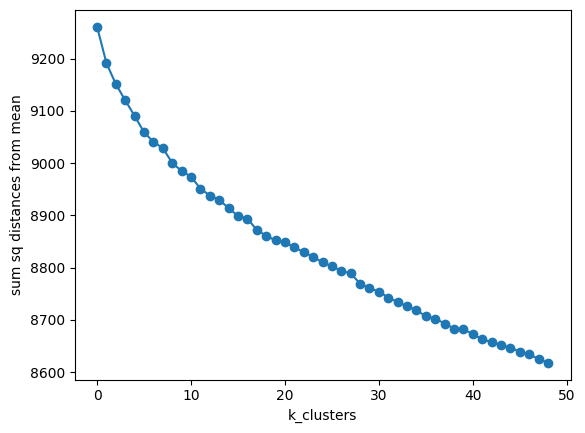

In [27]:
plt.clf()
plt.plot(cluster_errors, "o-")
plt.xlabel("k_clusters")
plt.ylabel("sum sq distances from mean")
plt.show()

In [28]:
k = 28
kmeans = KMeans(n_clusters=k, random_state=42,n_init=1)
kmeans_labels = kmeans.fit_predict(X_reduced)
df['kmean_clusters'] = kmeans_labels

In [29]:
from sklearn.metrics import silhouette_score
import seaborn as sns
kmeans_silhouette = silhouette_score(X_reduced, kmeans_labels)
print(f"Silhouette Score (K-Means): {kmeans_silhouette}")

Silhouette Score (K-Means): 0.009666981807009945


In [30]:
from sklearn.metrics import davies_bouldin_score
davies_bouldin_kmeans = davies_bouldin_score(X_reduced, kmeans_labels)
print(f"Davies Bouldin Score (K-Means): {davies_bouldin_kmeans}")

Davies Bouldin Score (K-Means): 7.851008490226955


In [31]:
from sklearn.metrics import calinski_harabasz_score
ch_score = calinski_harabasz_score(X_reduced, kmeans_labels)

print(f"Calinski-Harabasz Index (Variance Ratio Criterion): {ch_score}")

Calinski-Harabasz Index (Variance Ratio Criterion): 19.832278310191448


In [32]:
!pip install umap-learn

In [33]:
from umap import UMAP

2024-05-10 14:51:59.268096: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-05-10 14:51:59.268207: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-05-10 14:51:59.433725: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


In [34]:
umap_embeddings = UMAP(n_neighbors=100, min_dist=0.3, n_components=2)

In [35]:
X_umap = umap_embeddings.fit_transform(X_reduced)

In [36]:
from sklearn.manifold import TSNE

tsne = TSNE(verbose=1, perplexity=100, random_state=42)
X_embedded = tsne.fit_transform(X.toarray())

[t-SNE] Computing 301 nearest neighbors...
[t-SNE] Indexed 10000 samples in 0.031s...
[t-SNE] Computed neighbors for 10000 samples in 13.728s...
[t-SNE] Computed conditional probabilities for sample 1000 / 10000
[t-SNE] Computed conditional probabilities for sample 2000 / 10000
[t-SNE] Computed conditional probabilities for sample 3000 / 10000
[t-SNE] Computed conditional probabilities for sample 4000 / 10000
[t-SNE] Computed conditional probabilities for sample 5000 / 10000
[t-SNE] Computed conditional probabilities for sample 6000 / 10000
[t-SNE] Computed conditional probabilities for sample 7000 / 10000
[t-SNE] Computed conditional probabilities for sample 8000 / 10000
[t-SNE] Computed conditional probabilities for sample 9000 / 10000
[t-SNE] Computed conditional probabilities for sample 10000 / 10000
[t-SNE] Mean sigma: 0.315650
[t-SNE] KL divergence after 50 iterations with early exaggeration: 83.328598
[t-SNE] KL divergence after 1000 iterations: 2.573226


/tmp/ipykernel_33/749906980.py:5: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.scatterplot(x=X_embedded[:,0], y=X_embedded[:,1], palette=palette)


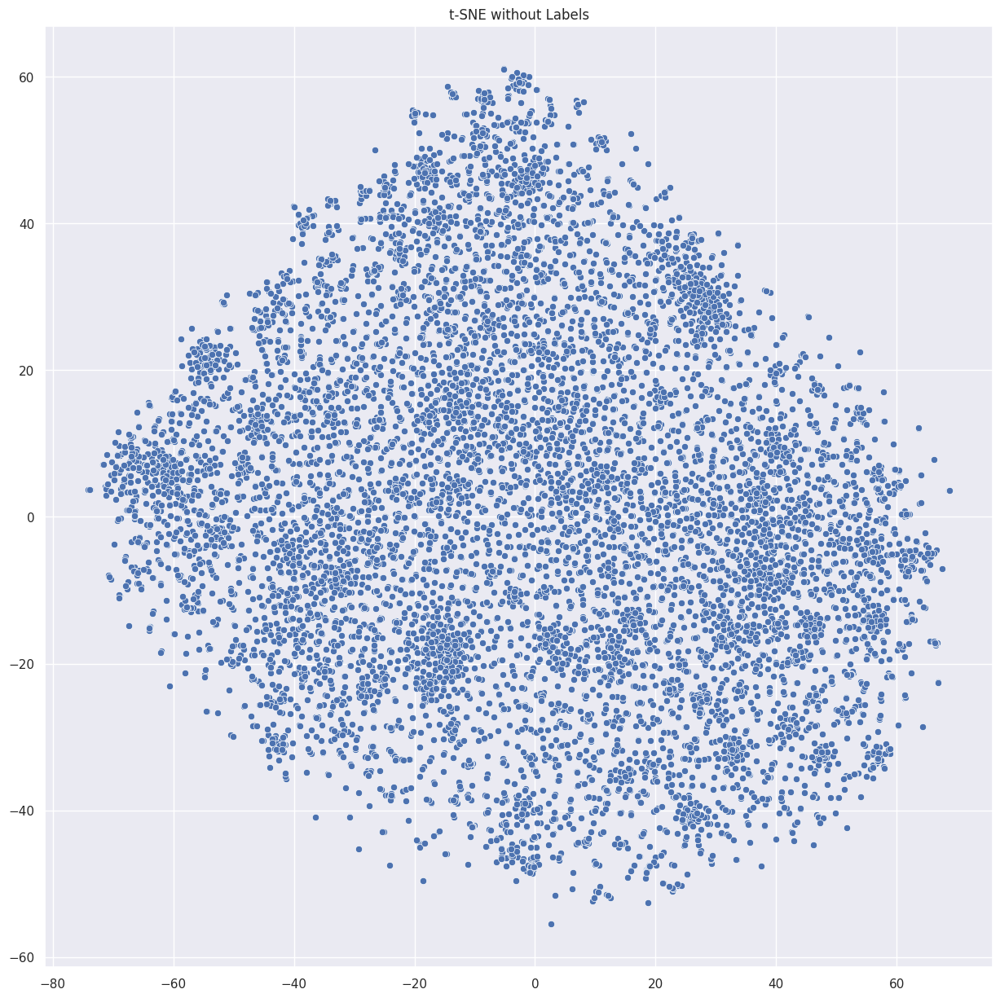

In [37]:
import seaborn as sns
sns.set(rc={'figure.figsize':(15,15)})
palette = sns.color_palette("bright", 1)

sns.scatterplot(x=X_embedded[:,0], y=X_embedded[:,1], palette=palette)
plt.title('t-SNE without Labels')
plt.savefig("t-sne_arxvid.png")
plt.show()

/tmp/ipykernel_33/1424676886.py:4: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.scatterplot(x=X_umap[:,0], y=X_umap[:,1], palette=palette)


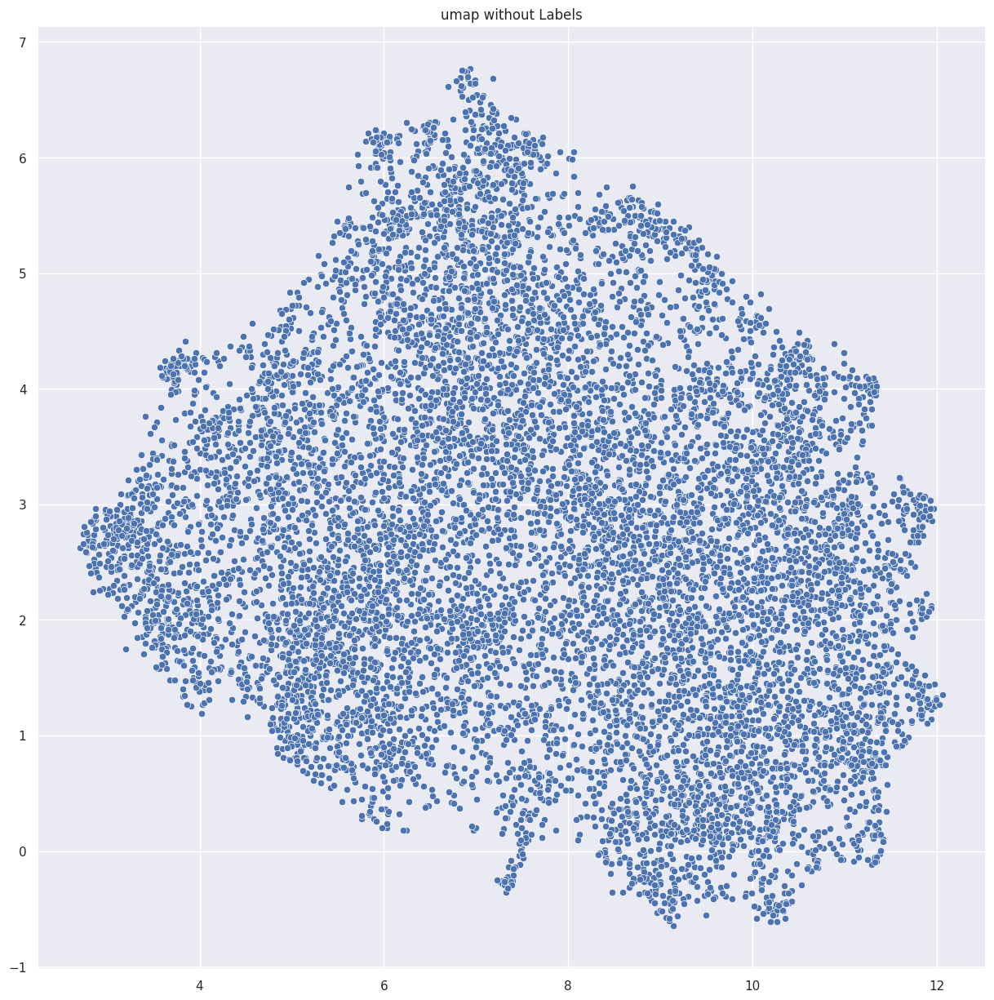

In [38]:
sns.set(rc={'figure.figsize':(15,15)})
palette = sns.color_palette("bright", 1)

sns.scatterplot(x=X_umap[:,0], y=X_umap[:,1], palette=palette)
plt.title('umap without Labels')
plt.savefig("umap_arxvid.png")
plt.show()

/tmp/ipykernel_33/1486998652.py:5: UserWarning: 
The palette list has fewer values (20) than needed (28) and will cycle, which may produce an uninterpretable plot.
  sns.scatterplot(x=X_embedded[:,0], y=X_embedded[:,1], hue=kmeans_labels, legend='full', palette=palette)


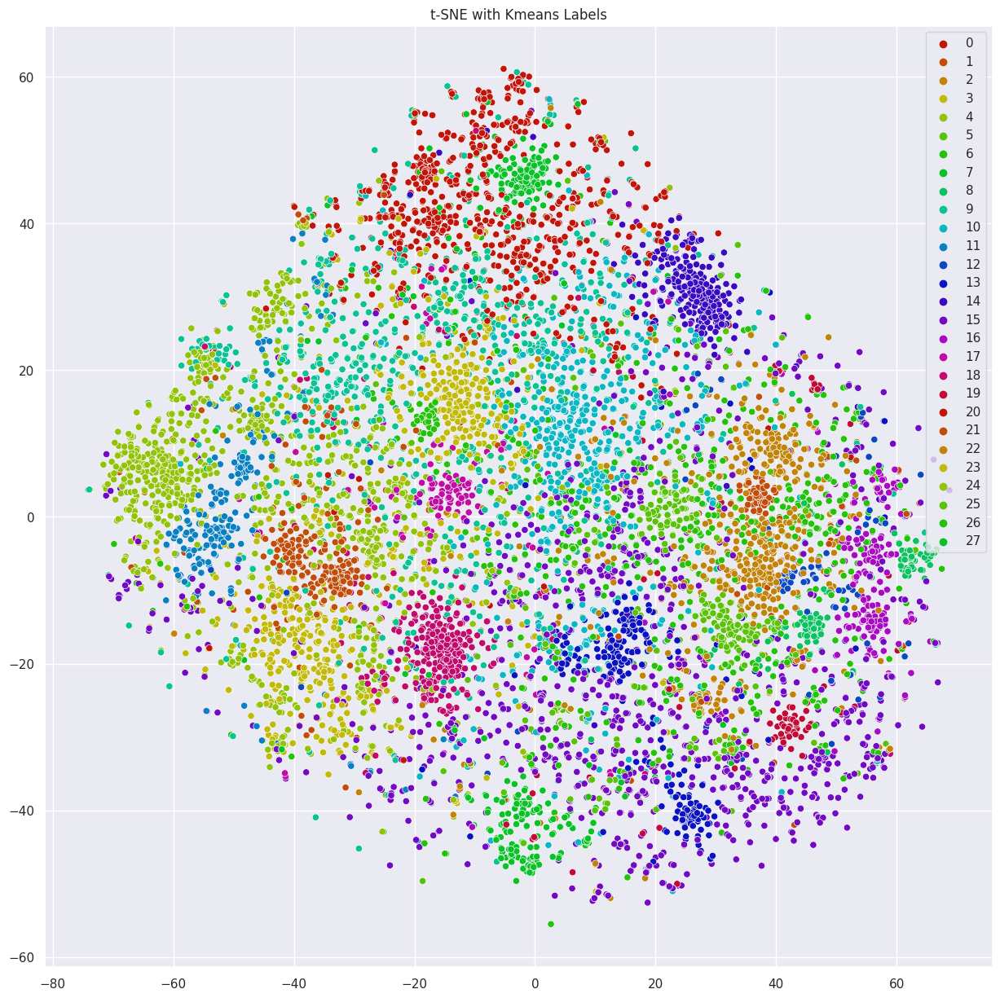

In [39]:
%matplotlib inline
sns.set(rc={'figure.figsize':(15,15)})
palette = sns.hls_palette(20, l=.4, s=.9)

sns.scatterplot(x=X_embedded[:,0], y=X_embedded[:,1], hue=kmeans_labels, legend='full', palette=palette)
plt.title('t-SNE with Kmeans Labels')
plt.savefig("cluster_tsne.png")
plt.show()

/tmp/ipykernel_33/2710743359.py:4: UserWarning: 
The palette list has fewer values (20) than needed (28) and will cycle, which may produce an uninterpretable plot.
  sns.scatterplot(x=X_umap[:,0], y=X_umap[:,1], hue=kmeans_labels, legend='full', palette=palette)


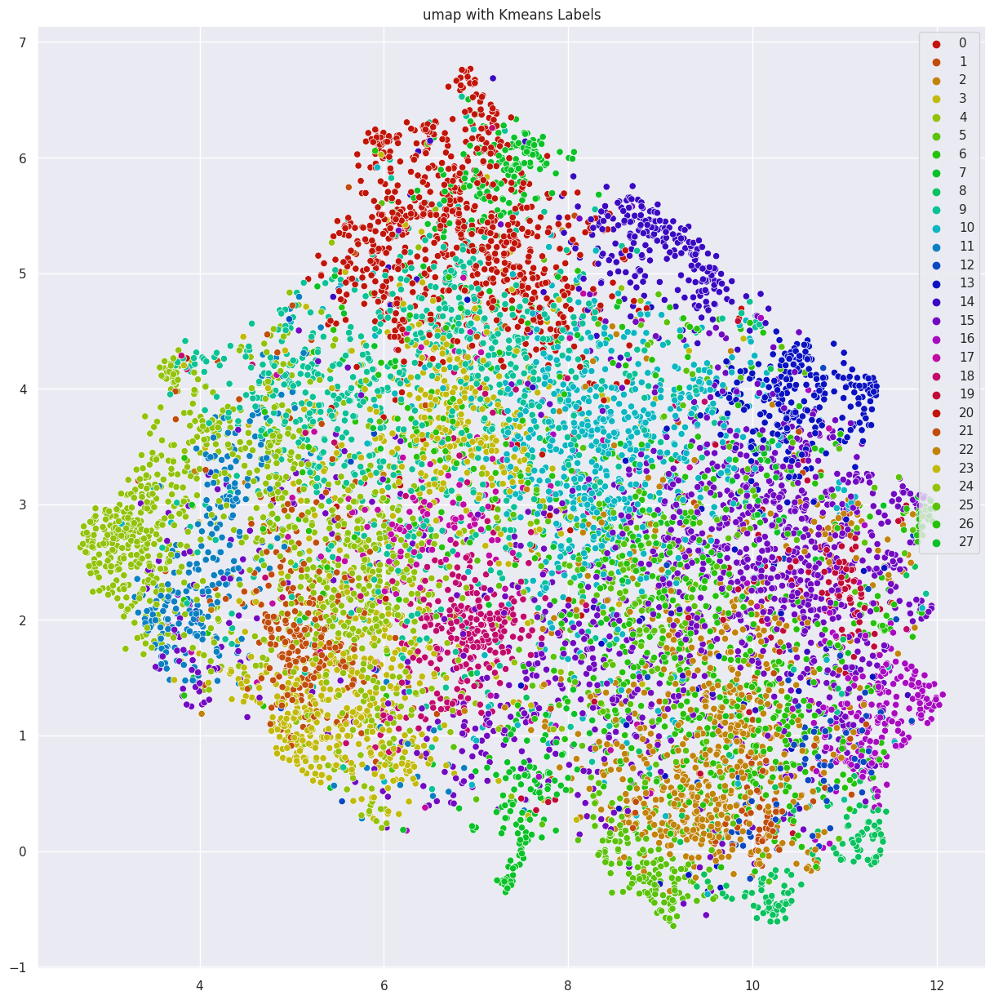

In [40]:
sns.set(rc={'figure.figsize':(15,15)})
palette = sns.hls_palette(20, l=.4, s=.9)

sns.scatterplot(x=X_umap[:,0], y=X_umap[:,1], hue=kmeans_labels, legend='full', palette=palette)
plt.title('umap with Kmeans Labels')
plt.savefig("cluster_umap_kmeans_labels.png")
plt.show()

In [41]:
import plotly.express as px
fig = px.scatter(df, x=X_embedded[:,0], y=X_embedded[:,1], color=kmeans_labels.astype(str),
                 hover_data=['id', 'authors', 'title',],
                 height= 1000, width=1000,
                title = "t-SNE with Kmeans Labels")
fig.show()

/opt/conda/lib/python3.10/site-packages/plotly/express/_core.py:2065: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  sf: grouped.get_group(s if len(s) > 1 else s[0])


In [42]:
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.decomposition import PCA
from sklearn.cluster import SpectralClustering
import pandas as pd

In [43]:
spectral = SpectralClustering(n_clusters=k, random_state=42, n_init=1)  # Using the same k value for comparison
spectral_labels = spectral.fit_predict(X_reduced)
df['spectral_clusters'] = spectral_labels

In [44]:
spectral_silhouette = silhouette_score(X_reduced, spectral_labels)
print(f"Silhouette Score (Spectral): {spectral_silhouette}")

Silhouette Score (Spectral): 0.008752447493378925


In [45]:
from sklearn.metrics import davies_bouldin_score
davies_bouldin_spectral = davies_bouldin_score(X_reduced, spectral_labels)
print(f"Davies Bouldin Score (Spectral): {davies_bouldin_spectral}")

Davies Bouldin Score (Spectral): 7.511654764714547


In [46]:
from sklearn.metrics import calinski_harabasz_score
ch_score = calinski_harabasz_score(X_reduced, spectral_labels)

print(f"Calinski-Harabasz Index (Variance Ratio Criterion): {ch_score}")

Calinski-Harabasz Index (Variance Ratio Criterion): 20.348411360568583


/tmp/ipykernel_33/2069832697.py:6: UserWarning:


The palette list has fewer values (20) than needed (28) and will cycle, which may produce an uninterpretable plot.



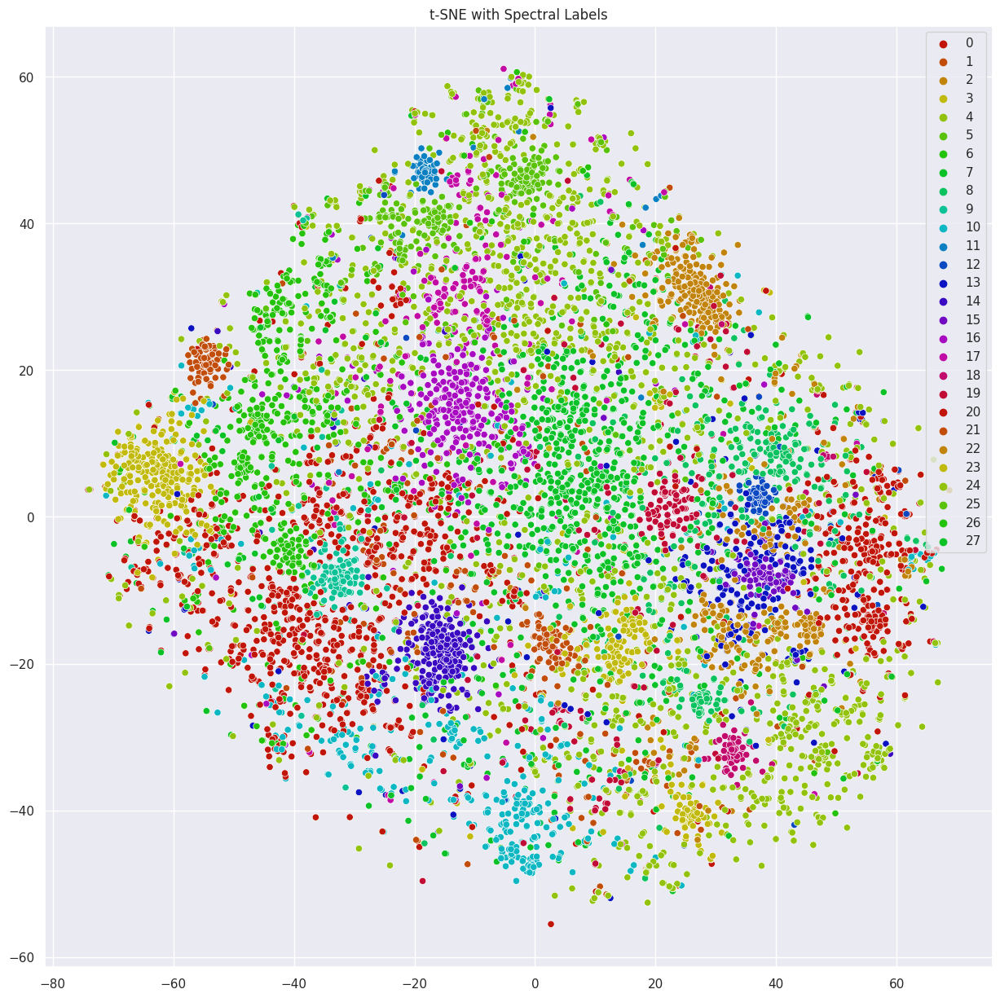

In [47]:
%matplotlib inline
sns.set(rc={'figure.figsize':(15,15)})
palette = sns.hls_palette(20, l=.4, s=.9)


sns.scatterplot(x=X_embedded[:,0], y=X_embedded[:,1], hue=spectral_labels, legend='full', palette=palette)
plt.title('t-SNE with Spectral Labels')
plt.savefig("spectral_cluster_tsne.png")
plt.show()

/tmp/ipykernel_33/2010510807.py:8: UserWarning:


The palette list has fewer values (20) than needed (28) and will cycle, which may produce an uninterpretable plot.



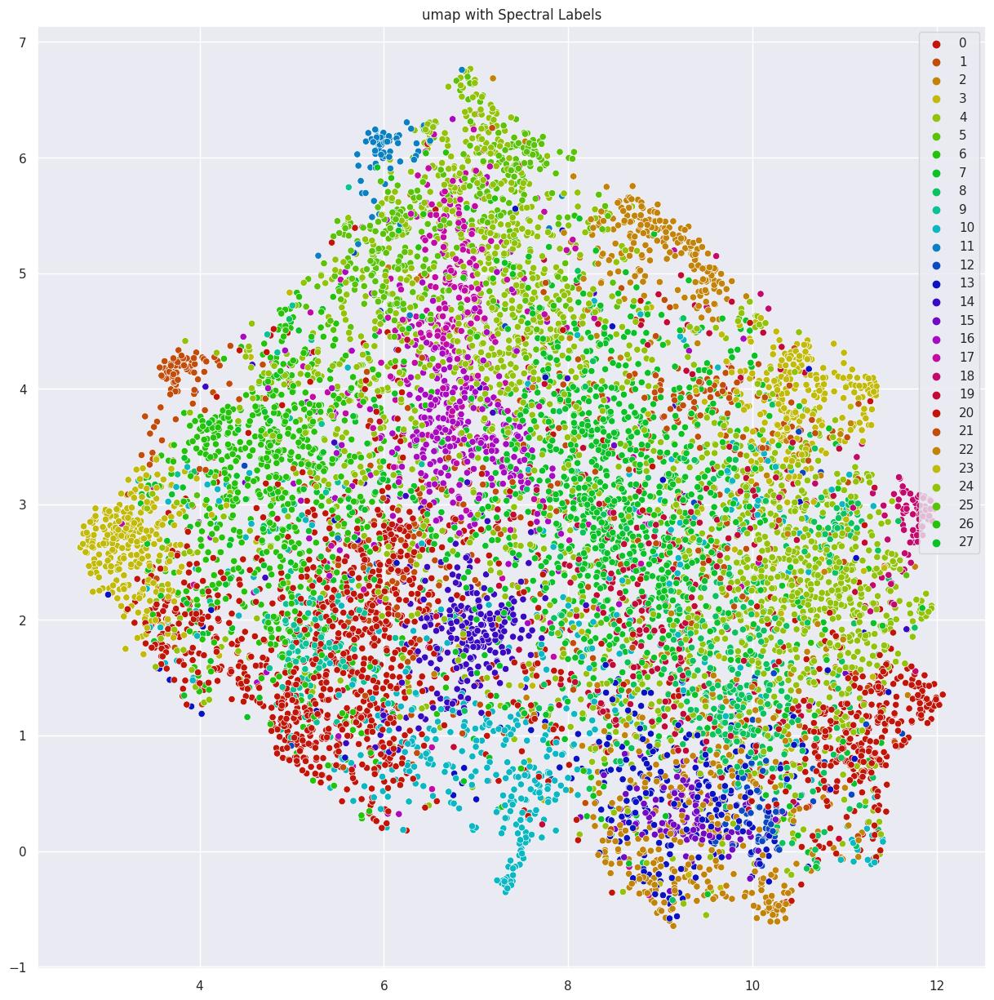

In [48]:
# sns settings
sns.set(rc={'figure.figsize':(15,15)})

# colors
palette = sns.hls_palette(20, l=.4, s=.9)

# plot
sns.scatterplot(x=X_umap[:,0], y=X_umap[:,1], hue=spectral_labels, legend='full', palette=palette)
plt.title('umap with Spectral Labels')
plt.savefig("cluster_umap_spectral_labels.png")
plt.show()

In [49]:
import plotly.express as px
fig = px.scatter(df, x=X_embedded[:,0], y=X_embedded[:,1], color=spectral_labels.astype(str),
                 hover_data=['id', 'authors', 'title',],
                 height= 1000, width=1000,
                title = "t-SNE with Spectral Labels")
fig.show()

/opt/conda/lib/python3.10/site-packages/plotly/express/_core.py:2065: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.



USECASE - Research Paper Recommendation System

In [50]:
import warnings
warnings.filterwarnings('ignore')

import os
import json
import random
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

import tensorflow as tf
import tensorflow_hub as hub
from tensorflow.keras.losses import cosine_similarity
from sklearn.decomposition import PCA
from sklearn.neighbors import KNeighborsClassifier

In [51]:
FILE = '/kaggle/input/arxiv/arxiv-metadata-oai-snapshot.json'

def get_data():
    with open(FILE) as f:
        for line in f:
            yield line

In [52]:
dataframe = {
    'title': [],
    'year': [],
    'abstract': []
}

data = get_data()
for i, paper in enumerate(data):
    paper = json.loads(paper)
    try:
        date = int(paper['update_date'].split('-')[0])
        if date > 2023:
            dataframe['title'].append(paper['title'])
            dataframe['year'].append(date)
            dataframe['abstract'].append(paper['abstract'])
    except: pass

In [71]:
df1 = pd.DataFrame(dataframe)
df1.head(10)
#df1.shape

,title,year,abstract
0,The Veldkamp Space of Two-Qubits,2024,Given a remarkable representation of the gen...
1,"Quasi Ordinary Singularities, Essential Diviso...",2024,We define Poincar\'e series associated to a ...
2,Third Order Newton's Method for Zernike Polyno...,2024,The Zernike radial polynomials are a system ...
3,Quantum Properties and Gravitational Field of ...,2024,We find that a field with oscillations of ma...
4,Universal flattening of Frobenius,2024,For a variety $X$ of positive characteristic...
5,The nature of electromagnetic energy,2024,The nature of electromagnetic energy for gen...
6,Periodic relativity: the theory of gravity in ...,2024,"In periodic relativity (PR), the curved spac..."
7,Orbital period derivative of a binary system u...,2024,It is proposed that the equations of motion ...
8,On local equivalence problem of spacetimes wit...,2024,Considered is the problem of local equivalen...
9,A recursive linear time modular decomposition ...,2024,A module of a graph G is a set of vertices t...


In [54]:
df_sample=df1.sample(n=80000,random_state=42)

In [55]:
import pandas as pd
df_sample.to_csv('/kaggle/working/df4.csv',index=True)

In [72]:
MODEL_URL = "https://tfhub.dev/google/universal-sentence-encoder/4"

# KerasLayer
sentence_encoder_layer = hub.KerasLayer(MODEL_URL,
                                        input_shape=[],
                                        dtype=tf.string,
                                        trainable=False,
                                        name="use")

abstracts = df1["abstract"].to_list()

In [57]:
embeddings = []
batch_size = 3000
num_batches = len(abstracts)

In [73]:
if not abstracts:
    print("Error: Abstracts list is empty.")
else:
    embeddings = []
    batch_size = 3000
    num_batches = (len(abstracts) + batch_size - 1) // batch_size  
    for i in range(num_batches):
        start_idx = i * batch_size
        end_idx = min((i + 1) * batch_size, len(abstracts))
        batch_abstracts = abstracts[start_idx:end_idx]

        if batch_abstracts:  # Check if batch is not empty
            batch_embeddings = sentence_encoder_layer(batch_abstracts)
            embeddings.extend(batch_embeddings.numpy())
        else:
            print(f"Warning: Batch {i} is empty.")

    embeddings = np.array(embeddings)
    y = df1.index


In [74]:
nn = KNeighborsClassifier(n_neighbors=6)
nn.fit(embeddings,y)

KNeighborsClassifier(n_neighbors=6)

In [60]:
import joblib

In [61]:
model_file_path = '/kaggle/working/knn_model_4.joblib'
joblib.dump(nn, model_file_path)

['/kaggle/working/knn_model_4.joblib']

In [77]:
for _ in range(5):
    idx = random.randint(i, len(y))
    sample = df1["title"][idx]
    dist, index = nn.kneighbors(X=embeddings[idx,:].reshape(1,-1))
    print(f"Sample:\n{sample}\n")
    for i in range(1,6):
        print(f"Recommendation {i}:\n{df1['title'][index[0][i]]}\n")
    print("===============\n")

Sample:
Advancing Quantum Software Engineering: A Vision of Hybrid Full-Stack
  Iterative Model

Recommendation 1:
QFaaS: A Serverless Function-as-a-Service Framework for Quantum
  Computing

Recommendation 2:
A Design Framework for the Simulation of Distributed Quantum Computing

Recommendation 3:
QCSHQD: Quantum computing as a service for Hybrid classical-quantum
  software development: A Vision

Recommendation 4:
Multi-GPU-Enabled Hybrid Quantum-Classical Workflow in Quantum-HPC
  Middleware: Applications in Quantum Simulations

Recommendation 5:
QSimPy: A Learning-centric Simulation Framework for Quantum Cloud
  Resource Management


Sample:
Spinor-helicity representations of (A)dS$_4$ particles of any mass

Recommendation 1:
Quantum Space-Time Symmetries: A Principle of Minimum Group
  Representation

Recommendation 2:
New Physics hints from $\tau$ scalar interactions and $(g-2)_{e,\mu}$

Recommendation 3:
Generalized Positive Energy Representations of the Group of Compactly
  Sup